# preparation des données

In [125]:
from collections import defaultdict
import os

import matplotlib.pyplot as plt
import numpy as np

### Compter le nombre de documents dans le corpus

In [126]:
path = "C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/txt"
files = sorted(os.listdir(path))
len(files)

1950

### Explorer les noms de fichier

In [127]:
chaine = 'KB_JB421_1904-02-05_01-00002'
type(chaine)

str

In [128]:
# la méthode split
chaine_split = chaine.split('_')
chaine_split

['KB', 'JB421', '1904-02-05', '01-00002']

In [129]:
# Accéder à la date
date = chaine_split[2] # on prend le deuxieme de la liste diu tableau 

# Accéder à l'année
date_split = date.split('-') # on le split 
year = date_split[0] # et on recupere le premiere element
# Manipuler les str pour convertir une année en décennie
year[:3]
year[-1]
year[:3] + '0s'

'1900s'

In [130]:
all_years = [str(year) for year in range(1800, 1970)]  # pr savoir par deceni combien on a de journaux

In [131]:
count_decade = defaultdict(int) # il instanci un dictionaire dict a zero
count_month = defaultdict(int)
count_newspapers = defaultdict(int)
covered_years = set()

for f in files:
    if "_" in f and f.endswith("txt"):
        elems = f.split("_")
        
        newspaper = elems[1]
        
        year = elems[2].split("-")[0]
        covered_years.add(year)
        decade = year[:3] + "0s"
        
        month = int(elems[2].split("-")[1])
        
        count_decade[decade] += 1
        count_newspapers[newspaper] += 1
        count_month[month] += 1
    else:
        print(f"Anomalous file: {f}")
count_newspapers[newspaper] #on affiche la valeur du stocké dans le dictionnaire nomé count_newspaper

274

In [132]:
number_of_decades = len(count_decade)
print("Nombre de décennies dans le corpus :", number_of_decades)

Nombre de décennies dans le corpus : 15


In [133]:
# Tri des décennies dans l'ordre croissant
sorted_decades = sorted(count_decade.keys())

# Affichage des 5 premières décennies
print("Les 11 premières décennies dans le corpus sont :", sorted_decades[:11])


Les 11 premières décennies dans le corpus sont : ['1830s', '1840s', '1850s', '1860s', '1870s', '1880s', '1890s', '1900s', '1910s', '1920s', '1930s']


In [134]:
print(f"Il y a {count_decade['1890s']} fichiers pour la décennie 1930s")

Il y a 305 fichiers pour la décennie 1930s


## Visualisation du nombre de journaux par mois


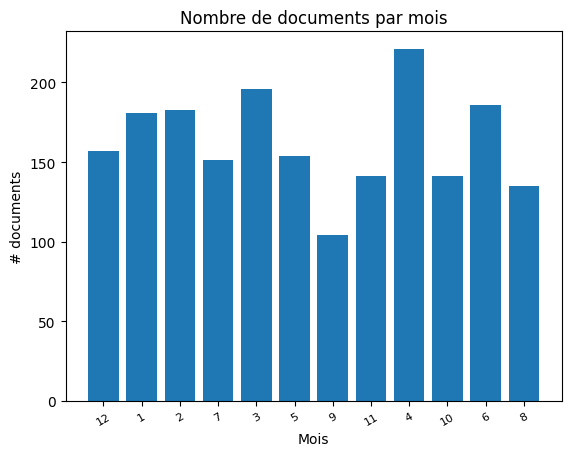

In [135]:
index = np.arange(len(count_month))
plt.bar(index, count_month.values())
plt.xlabel('Mois')
plt.ylabel('# documents')
plt.xticks(index, count_month.keys(), fontsize=8, rotation=30)
plt.title('Nombre de documents par mois')
plt.show()

## Classemment des documents dans des sous-groupes en fonction  des décennies auxquelles ils appartiennent

In [136]:
# Fonction pour obtenir la décennie à partir de l'année
def get_decade(year):
    return int(year) - int(year) % 10

# Chemins de base
txt_path = "C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/txt"

# Décennies choisies
chosen_decades = ['1870', '1880', '1890', '1900', '1910', '1920', '1930', '1940', '1950', '1960', '1970']

# Dictionnaire pour stocker le contenu des fichiers par décennie
content_by_decade = {decade: [] for decade in chosen_decades}

# Liste pour garder une trace des décennies et du nombre de fichiers
decade_counts = {}

# Itérer sur chaque fichier dans le dossier txt_path
for filename in os.listdir(txt_path):
    if os.path.isfile(os.path.join(txt_path, filename)):
        year = filename.split('_')[2][:4]
        decade = str(get_decade(year))
        if decade in chosen_decades:
            with open(os.path.join(txt_path, filename), 'r', encoding='utf-8') as file:
                content_by_decade[decade].append(file.read())
            decade_counts[decade] = decade_counts.get(decade, 0) + 1

# Chemin pour le dossier temporaire
temp_path = "C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/tmp"
if not os.path.exists(temp_path):
    os.mkdir(temp_path)

# Écrire le contenu dans des fichiers temporaire par décennie
for decade, contents in content_by_decade.items():
    with open(os.path.join(temp_path, f'{decade}.txt'), 'w', encoding='utf-8') as f:
        f.write(' '.join(contents))

# Afficher le nombre de fichiers par décennie
for decade, count in sorted(decade_counts.items()):
    print(f"Décennie {decade}: {count} fichiers trouvés")


Décennie 1870: 14 fichiers trouvés
Décennie 1880: 31 fichiers trouvés
Décennie 1890: 305 fichiers trouvés
Décennie 1900: 319 fichiers trouvés
Décennie 1910: 208 fichiers trouvés
Décennie 1920: 424 fichiers trouvés
Décennie 1930: 316 fichiers trouvés
Décennie 1940: 163 fichiers trouvés
Décennie 1950: 82 fichiers trouvés
Décennie 1960: 48 fichiers trouvés
Décennie 1970: 8 fichiers trouvés


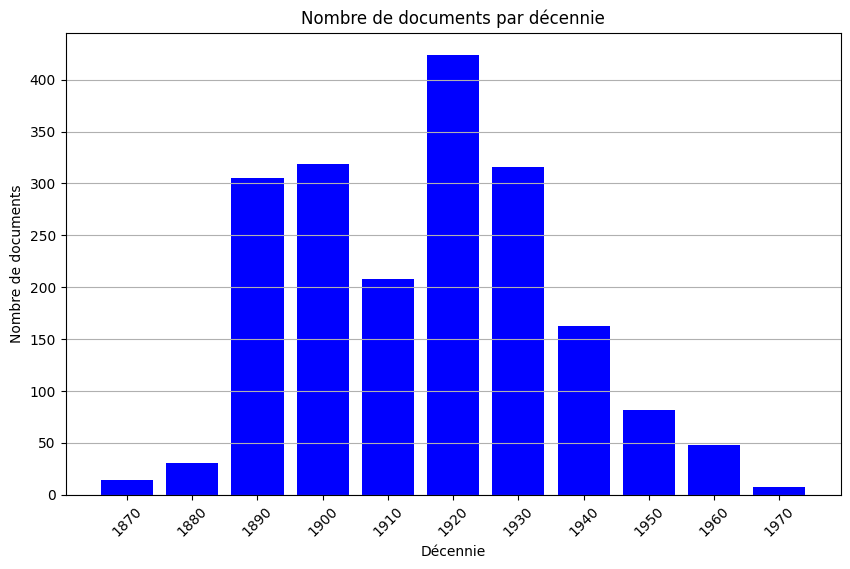

In [137]:
import os
import matplotlib.pyplot as plt

# Fonction pour obtenir la décennie à partir de l'année
def get_decade(year):
    return int(year) - int(year) % 10

# Chemins de base
txt_path = "C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/txt"

# Décennies choisies
chosen_decades = ['1870', '1880', '1890', '1900', '1910', '1920', '1930', '1940', '1950', '1960', '1970']

# Dictionnaire pour stocker le contenu des fichiers par décennie
content_by_decade = {decade: [] for decade in chosen_decades}

# Dictionnaire pour compter les fichiers par décennie
decade_counts = {decade: 0 for decade in chosen_decades}

# Itérer sur chaque fichier dans le dossier txt_path
for filename in os.listdir(txt_path):
    if os.path.isfile(os.path.join(txt_path, filename)):
        year = filename.split('_')[2][:4]
        decade = str(get_decade(year))
        if decade in chosen_decades:
            with open(os.path.join(txt_path, filename), 'r', encoding='utf-8') as file:
                content_by_decade[decade].append(file.read())
            decade_counts[decade] += 1

# Préparation des données pour le graphique
decades = list(decade_counts.keys())
file_counts = list(decade_counts.values())

# Création du graphique
plt.figure(figsize=(10, 6))
plt.bar(decades, file_counts, color='blue')
plt.xlabel('Décennie')
plt.ylabel('Nombre de documents')
plt.title('Nombre de documents par décennie')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Afficher le graphique
plt.show()


# Extraction de Keywords

In [138]:
import os
import yake

In [139]:
# Instantier l'extracteur de mots clés
kw_extractor = yake.KeywordExtractor(lan="fr", top=50)
kw_extractor

In [217]:
# Lister les Fichiers
data_path = "C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/txt"
files = os.listdir(data_path)

In [218]:
# Imprimer le nombre de fichiers identifiés
len(files)

1950

In [219]:
# Les dix premiers fichiers
files[:10]

['KB_JB1051_1921-12-24_01-00004.txt',
 'KB_JB1051_1922-01-21_01-00001.txt',
 'KB_JB1051_1922-01-28_01-00003.txt',
 'KB_JB1051_1922-02-04_01-00003.txt',
 'KB_JB1051_1922-07-29_01-00004.txt',
 'KB_JB1051_1922-12-16_01-00003.txt',
 'KB_JB1051_1924-01-26_01-00001.txt',
 'KB_JB1051_1924-03-06_01-00004.txt',
 'KB_JB1051_1924-03-27_01-00004.txt',
 'KB_JB1051_1924-05-01_01-00004.txt']

In [223]:
# Choisir un fichier
this_file = files[0]
this_file

'KB_JB1051_1921-12-24_01-00004.txt'

In [224]:
# Récupérer le texte du fichier
text = open(os.path.join(data_path, this_file), 'r', encoding='utf-8').read()
text[:500]

"\\ La Propagande Communiste parmi les Femmes La Fédération Bruxelloise du Parti s'est préoccupée récemment de la constitution, dans son sein, d'une commission spéciale chargée du travail d'organisation et de propagande parmi les femmes. Nous publions, in-extenso, l'intéressant et documenté rapport soumis par la camarade Kestemont, membre du Comité Central, à la réunion des membres féminins du Parti, tenue le 6 décembre 1921. Les différentes fédérations du pays voudront sans aucun doute s'inspirer"

In [225]:
# Extraire les mots clés de ce texte
keywords = kw_extractor.extract_keywords(text)
keywords

[('Parti Communiste', 0.0038521366345077375),
 ('Parti', 0.004466574113128145),
 ('Partis Communistes', 0.00513618217934365),
 ('Femmes', 0.005895081840050901),
 ('femmes communistes', 0.006812416670383046),
 ('Communiste', 0.009437214245260336),
 ("Parti s'est préoccupée", 0.010026903713280556),
 ('femme', 0.010105854582944402),
 ('travail', 0.01115838205208127),
 ("l'Internationale Communiste", 0.011726861437243023),
 ('commission', 0.012323403107909098),
 ('Parti Fédération bruxelloise', 0.01419599995419567),
 ('faire', 0.01419933290093184),
 ('Fédération', 0.014822746369071734),
 ("Parti Communiste d'employer", 0.014870470120603163),
 ('commission spéciale chargée', 0.016645521146478284),
 ('sections', 0.01865096616711836),
 ('ouvrières', 0.02100996285731709),
 ('Partis', 0.0214395557430151),
 ('Comité', 0.02172438452234716),
 ('femmes communistes utilisent', 0.021859850882325296),
 ('Parti Fédération', 0.02275163875509723),
 ('membres', 0.023135810455762816),
 ('camarades communis

In [220]:
# Boucle pour traiter chaque fichier
for this_file in files:
    # Récupérer le texte du fichier
    with open(os.path.join(data_path, this_file), 'r', encoding='utf-8') as file:
        text = file.read()

In [221]:
# Extraire les mots clés de ce texte
keywords = kw_extractor.extract_keywords(text)
keywords

[('Brooke Bond', 0.010866834443294263),
 ('saint Nicolas', 0.013653865317001206),
 ('thé Brooke Bond', 0.018038053175308093),
 ('Vlaams Economisch Verbond', 0.018196225325572985),
 ('Services publics', 0.02145358904487989),
 ('BRUXELLES', 0.022934358267137765),
 ('grand saint Nicolas', 0.024792419466663957),
 ('saint Nicolas fera', 0.02967700110507164),
 ('grève Brooke Bond', 0.03010032397395289),
 ('Brooke Bond Tea', 0.03057059769671347),
 ('ENFANTS', 0.032204389116762676),
 ('Services', 0.037477128504924684),
 ('Nicolas', 0.04132029645250815),
 ('d’un', 0.0426341858625853),
 ('OCTOBRE', 0.04326466451953742),
 ('saint', 0.04363125604775795),
 ('Vlaams Economisch', 0.043833840842742944),
 ('Economisch Verbond', 0.043833840842742944),
 ('British Science Muséum', 0.04449233688566208),
 ('Brooke', 0.04540225063134825),
 ('Bond', 0.04540225063134825),
 ('thé', 0.04927729562512198),
 ('Witte de Haelen', 0.051219150041336155),
 ('Mouscron', 0.05455802228134063),
 ('Brooke Bond figure', 0.054

In [222]:
# Ne garder que les bigrammes
kept = []
for kw, score in keywords:
    words = kw.split()
    if len(words) == 2:
        kept.append(kw)
kept

['Brooke Bond',
 'saint Nicolas',
 'Services publics',
 'Vlaams Economisch',
 'Economisch Verbond',
 'grand saint',
 'thé racontée',
 'Santé publique',
 'thé Brooke',
 'Nicolas fera',
 'petite histoire']

In [201]:
# pour extrait les mots cles de l'ensemble du corpus
for f in sorted(files)[:10]:
    text = open(os.path.join(data_path, f), 'r', encoding="utf-8").read()
    keywords = kw_extractor.extract_keywords(text)
    kept = []
    for kw, score in keywords:
        words = kw.split()
        if len(words) == 2:
            kept.append(kw)
    print(f"{f} mentions these keywords: {', '.join(kept)}...")

KB_JB1051_1921-12-24_01-00004.txt mentions these keywords: Parti Communiste, Partis Communistes, femmes communistes, l'Internationale Communiste, Parti Fédération, Comité fédéral, Parti s'est, sections locales, camarades communistes, Fédération Bruxelloise, Propagande Communiste, classe ouvrière, l'éducation communiste, commission spéciale...
KB_JB1051_1922-01-21_01-00001.txt mentions these keywords: PREMIERE AIMÉE, Communiste Belge, Louise Coens, Parti Communiste, femmes communistes, Drapeau Rouge, Jacquemotte Administration, Télégramme d'Axelrod, Russie ouvrière, juntes militaires...
KB_JB1051_1922-01-28_01-00003.txt mentions these keywords: Lloyd George, Femmes Communistes, TSA RISME, RISME ESP, ESP AGNOL, AGNOL Pages, camarade José, Syndicat Libre, parti communiste, nouveaux camarades, comité central, fut assassiné...
KB_JB1051_1922-02-04_01-00003.txt mentions these keywords: TSA RISME, RISME ESP, ESP AGNOL, AGNOL Pages, Femmes Communistes, masses ouvrières, partis communistes, cla

# Reconnaissance d'entités nommées avec SpaCy par décénnie

In [148]:
from collections import defaultdict
import sys
import spacy
from spacy.lang.fr.examples import sentences
nlp = spacy.load('fr_core_news_md')

In [149]:
# Imprimer le corpus de Spacy
sentences


['Apple cherche à acheter une start-up anglaise pour 1 milliard de dollars',
 "Les voitures autonomes déplacent la responsabilité de l'assurance vers les constructeurs",
 "San Francisco envisage d'interdire les robots coursiers sur les trottoirs",
 'Londres est une grande ville du Royaume-Uni',
 'L’Italie choisit ArcelorMittal pour reprendre la plus grande aciérie d’Europe',
 "Apple lance HomePod parce qu'il se sent menacé par l'Echo d'Amazon",
 "La France ne devrait pas manquer d'électricité cet été, même en cas de canicule",
 'Nouvelles attaques de Trump contre le maire de Londres',
 'Où es-tu ?',
 'Qui est le président de la France ?',
 'Où est la capitale des États-Unis ?',
 'Quand est né Barack Obama ?']

In [150]:
# Isoler la première phrase
sent = sentences[0]
sent

'Apple cherche à acheter une start-up anglaise pour 1 milliard de dollars'

In [151]:
# Traiter la phrase avec Spacy
doc = nlp(sent)

In [152]:
type(doc)

spacy.tokens.doc.Doc

In [153]:
doc.text

'Apple cherche à acheter une start-up anglaise pour 1 milliard de dollars'

In [154]:
# Appliquer le test sur toutes les phrases
for sent in sentences:
    doc = nlp(sent)
    entities = []
    for ent in doc.ents:
        entities.append(f"{ent.text} ({ent.label_})")
    if entities:
        print(f"'{doc.text}' contient les entités suivantes : {', '.join(entities)}")
    else:
        print(f"'{doc.text}' ne contient aucune entité")

'Apple cherche à acheter une start-up anglaise pour 1 milliard de dollars' contient les entités suivantes : Apple (ORG)
'Les voitures autonomes déplacent la responsabilité de l'assurance vers les constructeurs' ne contient aucune entité
'San Francisco envisage d'interdire les robots coursiers sur les trottoirs' contient les entités suivantes : San Francisco (LOC)
'Londres est une grande ville du Royaume-Uni' contient les entités suivantes : Londres (LOC), Royaume-Uni (LOC)
'L’Italie choisit ArcelorMittal pour reprendre la plus grande aciérie d’Europe' contient les entités suivantes : L’Italie (LOC), ArcelorMittal (ORG), Europe (LOC)
'Apple lance HomePod parce qu'il se sent menacé par l'Echo d'Amazon' contient les entités suivantes : Apple (ORG), HomePod (MISC), Echo (MISC), Amazon (ORG)
'La France ne devrait pas manquer d'électricité cet été, même en cas de canicule' contient les entités suivantes : La France (LOC)
'Nouvelles attaques de Trump contre le maire de Londres' contient les e

In [155]:
# Nombre de caractères à lire de chaque fichier
n = 1000000

# Lire les premiers 'n' caractères de chaque fichier de décennie et stocker le contenu
content_preview_by_decade = {}

for decade in chosen_decades:
    file_path = os.path.join(temp_path, f'{decade}.txt')
    with open(file_path, 'r', encoding='utf-8') as file:
        content_preview_by_decade[decade] = file.read(n)

# Maintenant, content_preview_by_decade contient les premiers 'n' caractères de chaque fichier de décennie
# Vous pouvez faire des traitements supplémentaires avec ces données si nécessaire


In [156]:
%%time
# Dictionnaire pour stocker les documents traités par décennie
processed_docs_by_decade = {}

# Traiter le texte pour chaque décennie
for decade, text in content_preview_by_decade.items():
    doc = nlp(text)
    processed_docs_by_decade[decade] = doc

CPU times: total: 5min 39s
Wall time: 5min 45s


In [157]:
# Dictionnaire pour stocker le comptage des personnes pour chaque décennie
people_by_decade = defaultdict(lambda: defaultdict(int))

# Compter les entités pour chaque décennie
for decade, doc in processed_docs_by_decade.items():
    for ent in doc.ents:
        if ent.label_ == "PER" and len(ent.text) > 3:
            people_by_decade[decade][ent.text] += 1

In [158]:
# Trier et imprimer les entités pour chaque décennie
for decade, people in people_by_decade.items():
    # Trier les personnes par fréquence dans la décennie actuelle
    sorted_people = sorted(people.items(), key=lambda kv: kv[1], reverse=True)

    # Imprimer les 50 premières personnes les plus fréquentes
    print(f"--- Décennie {decade} ---")
    for person, freq in sorted_people[:50]:
        print(f"{person} apparait {freq} fois dans le corpus")
    print("\n")


--- Décennie 1870 ---
M. Thiers apparait 15 fois dans le corpus
Marchais apparait 10 fois dans le corpus
l'Empereur apparait 9 fois dans le corpus
Messieurs apparait 9 fois dans le corpus
Robespierre apparait 9 fois dans le corpus
Livingstone apparait 9 fois dans le corpus
comte de Chambord apparait 8 fois dans le corpus
M. Stanley apparait 8 fois dans le corpus
Constant apparait 7 fois dans le corpus
Victor Hugo apparait 6 fois dans le corpus
M. Ledoux apparait 6 fois dans le corpus
Fausty apparait 6 fois dans le corpus
Cortès apparait 5 fois dans le corpus
Courtney apparait 5 fois dans le corpus
Lundi apparait 5 fois dans le corpus
Louis Blanc apparait 5 fois dans le corpus
Goll apparait 5 fois dans le corpus
Jules Allix apparait 5 fois dans le corpus
Thiers apparait 5 fois dans le corpus
Lucia apparait 5 fois dans le corpus
Françoise apparait 5 fois dans le corpus
Agio apparait 4 fois dans le corpus
Hilarité apparait 4 fois dans le corpus
m. delcour apparait 4 fois dans le corpus
M.

# analyse de la tonalité ou le sentiment des textes associés à des entités nommées PER

In [ ]:
import sys
import spacy
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

# Charger le modèle spacy pour la reconnaissance d'entités
nlp = spacy.load('fr_core_news_md')

# Initialiser TextBlob avec PatternTagger et PatternAnalyzer pour l'analyse de sentiment
tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())

def get_sentiment(input_text):
    blob = tb(input_text)
    polarity, subjectivity = blob.sentiment
    polarity_perc = f"{100 * abs(polarity):.0f}%"
    subjectivity_perc = f"{100 * subjectivity:.0f}%"
    polarity_str = "positive" if polarity > 0 else "negative" if polarity < 0 else "neutral"
    subjectivity_str = "subjective" if subjectivity > 0 else "objective"
    return f"{polarity_perc} {polarity_str}, {subjectivity_perc} {subjectivity_str}"

# Analyser le sentiment pour chaque entité PER dans chaque décennie
for decade, texts in content_by_decade.items():
    print(f"--- Décennie {decade} ---")
    for text in texts:
        doc = nlp(text)
        for ent in doc.ents:
            if ent.label_ == "PER":
                sentiment_summary = get_sentiment(ent.sent.text)
                print(f"Entité: {ent.text}\nPhrase: {ent.sent.text}\nSentiment: {sentiment_summary}\n")
    print("\n")


--- Décennie 1870 ---
Entité: Ja Chambre
Phrase: Les auteurs de l'interpellation ont le droit de venir sommer Ja Chambre et le gouvernement d'indiquer le jour de cette séance ultérieure.
Sentiment: 8% positive, 0% objective

Entité: M. J. Favre
Phrase: C'est pour cela que j'ai dit à M. J. Favre que je répondrais en demandant qu'on fixât lundi.
Sentiment: 0% neutral, 0% objective

Entité: M.
Phrase: La question est importante, et je n'en veux pour preuve que l'étendue que M. le ministre de la justice a donnée à ses observations.
Sentiment: 25% positive, 22% subjective

Entité: m.
Phrase: m. le ministre be la justice.
Sentiment: 0% neutral, 0% objective

Entité: Xes
Phrase: Xes ministres ont été entendus deux fois, et vouloir maintenir l'ajournement indéfini.
Sentiment: 0% neutral, 0% objective

Entité: m.
Phrase: m. le garde des sceaux.
Sentiment: 0% neutral, 0% objective

Entité: ernest picard
Phrase: " m. ernest picard.
Sentiment: 0% neutral, 0% objective

Entité: M. bethmont
Phrase: 

In [161]:
import spacy
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

# Charger le modèle spacy pour la reconnaissance d'entités
nlp = spacy.load('fr_core_news_md')

# Initialiser TextBlob avec PatternTagger et PatternAnalyzer pour l'analyse de sentiment
tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())

def get_sentiment(input_text):
    blob = tb(input_text)
    polarity, subjectivity = blob.sentiment
    polarity_perc = f"{100 * abs(polarity):.0f}%"
    subjectivity_perc = f"{100 * subjectivity:.0f}%"
    polarity_str = "positive" if polarity > 0 else "negative" if polarity < 0 else "neutral"
    subjectivity_str = "subjective" if subjectivity > 0 else "objective"
    return f"{polarity_perc} {polarity_str}, {subjectivity_perc} {subjectivity_str}"

# Liste d'entités PER à rechercher
entities_to_find = [ "Méline", "princesse Stéphanie", "Germaine", "Miss Millier",  "Marie Popelin", "Woeste", "Lise", "Clémence Royer", "Jeanne Lavaud", "M. Caillaux", "Mme Depage",  "Mme Steinmann", "Clara Zetkin",  "Mme Hanau",  "Mme Dubrau", "Claire", "Mado",  "Marie-Astrid", "Maria Ciocan", "Mlle Hélène Fischer", "Mme Posse", "Isala Van Diest", "Sylvie", "Marie-José",  "Mère Madeleine"]  
# Analyser le sentiment des entités spécifiées dans chaque décennie
for decade, texts in content_by_decade.items():
    print(f"--- Décennie {decade} ---")
    for text in texts:
        doc = nlp(text)
        for ent in doc.ents:
            if ent.label_ == "PER" and ent.text in entities_to_find:
                sentiment_summary = get_sentiment(ent.sent.text)
                print(f"Entité: {ent.text}\nPhrase: {ent.sent.text}\nSentiment: {sentiment_summary}\n")
    print("\n")


--- Décennie 1870 ---


--- Décennie 1880 ---
Entité: princesse Stéphanie
Phrase: On télégraphie de Vienne au Gaulois que c'est S. A. R. le prince de Galles qui représentera la reine Victoria au mariage de l'archiduc Rodolphe avec la princesse Stéphanie.
Sentiment: 10% positive, 20% subjective

Entité: Méline
Phrase: M. de Freyànet a ajouté qu'il consentait volontiers, quant à lui, à entrer dans une nouvelle combinaison Méline, pour y garder le porte feuille de la guerre.
Sentiment: 8% positive, 18% subjective

Entité: Méline
Phrase: M. Méline s'est engagé d'une manière terme à reprendre ses pourparlers avec différents membres du Parlement.
Sentiment: 40% positive, 15% subjective

Entité: Méline
Phrase: M. Méline se rendra dans la matinée à l'Elysée pour faire connaître à M. Carnot s'il accepte définitivement la mission de former le futur cabinet.
Sentiment: 0% neutral, 0% objective

Entité: princesse Stéphanie
Phrase: ' aJfî* Faite divers — Nous lisons dans la fi tue frtie Presse que 

# analyse de sentiment des textes associés à "femmes"

In [162]:
import sys
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

In [163]:
tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())

def get_sentiment(input_text):
    blob = tb(input_text)
    polarity, subjectivity = blob.sentiment
    polarity_perc = f"{100*abs(polarity):.0f}"
    subjectivity_perc = f"{100*subjectivity:.0f}"
    if polarity > 0:
        polarity_str = f"{polarity_perc}% positive"
    elif polarity < 0:
        polarity_str = f"{polarity_perc}% negative"
    else:
        polarity_str = "neutral"
    if subjectivity > 0:
        subjectivity_str = f"{subjectivity}% subjective"
    else:
        subjectivity_str = "perfectly objective"
    print(f"This text is {polarity_str} and {subjectivity_str}.")

In [164]:
get_sentiment("Il est très important de gagner les femmes d'ouvriers II est nécessaire de mener parmi elles une propagande qui doit être rattachée à notre action dans l'usine ou travaille le mari.")

This text is 54% positive and 0.55% subjective.


In [165]:
get_sentiment("Les femmes communistes doivent être entraînées dans le travail politique général du parti")

This text is 2% negative and 0.025% subjective.


In [166]:
get_sentiment("En Autriche, les femmes communistes auront désormais une voix délibérative au comité central du parti")

This text is 2% negative and 0.03333333333333333% subjective.


In [167]:
get_sentiment("Ces soins astreignent les femmes à un surmenage très fatigant et celles qui sont obligées do travailler à la.")

This text is 40% negative and perfectly objective.


In [168]:
get_sentiment("Le Secrétariat international féminin a mené avec succès l'action pour la Journée des Femmes et l'assistance à la Russie, laquelle a été en même temps une action politique dirigée contre la société bourgeoise")

This text is 5% positive and 0.13999999999999999% subjective.


#  Analyse du Word Cloud par décennie 
### l'objectif ici est d'obervé la frequences de la presence de femmes aucours des décennies 

In [169]:
from collections import Counter
from wordcloud import WordCloud
import os
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from IPython.display import Image

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\beaujo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [170]:
sw = stopwords.words("french") # cree une liste de stopword nomé sw que l'on complete 
sw += ["les", "plus", "cette", "fait", "faire", "être", "deux", "comme", "dont", "tout", 
       "ils", "bien", "sans", "peut", "tous", "après", "ainsi", "donc", "cet", "sous",
       "celle", "entre", "encore", "toutes", "pendant", "moins", "dire", "cela", "non","très","jour",
       "faut", "trois", "aussi", "dit", "avoir", "doit", "contre", "depuis", "autres","temps",
       "van", "het", "autre", "jusqu","les", "plus", "cette", "fait", "faire", "être", "deux", "comme", "dont", "tout","rien","bonne","tous","vers","bien","peu","jeune","âge",
       "ils", "bien", "sans", "peut", "tous", "après", "ainsi", "donc", "cet", "sous","fin","année","rue","jamais","celle","leurs","dès",
       "celle", "entre", "encore", "toutes", "pendant", "moins", "dire", "cela", "non","quelques","également","petit","grand","matin","ceux",
       "faut", "trois", "aussi", "dit", "avoir", "doit", "contre", "depuis", "autres","déjà","prés","fois","grande","soir","matin","etc","suite",
       "van", "het", "autre", "jusqu", "ville", "rossel", "dem","plussieurs","voir","avant","alors","parts","chez","toute","bon","heures","cas","entrée",
      "cependant","vue","vis","chf","présenter","garage","heure","doute","ailleurs","vie","elles","effet","quatre","chaussée","bons","centre","celui",
       "neuf","point","certains","certain","nuit","main","tant","toujours","plusieurs","vitae","chaque","selon","parmi","parmis","quand","lieu","age","trop",
       "question","avenir","bas","gros","enfin","quelque","puis","devant","seulement","mise","mois","nom","reste","cinq"]
sw = set(sw)

#### Nettoyer le fichier à l'aide d'une fonction de nettoyage

In [171]:


def clean_all_texts_in_folder(folder):
    all_kept_words = []

    for filename in os.listdir(folder):
        if filename.endswith(".txt") and not filename.endswith("_clean.txt"):
            input_path = os.path.join(folder, filename)
            output_path = os.path.join(folder, filename.replace('.txt', '_clean.txt'))

            with open(input_path, 'r', encoding='utf-8') as f, open(output_path, "w", encoding='utf-8') as output:
                text = f.read()
                words = nltk.wordpunct_tokenize(text)
                kept = [w.upper() for w in words if len(w) > 2 and w.isalpha() and w.lower() not in sw]
                kept_string = " ".join(kept)
                output.write(kept_string)
                all_kept_words.extend(kept)

    return all_kept_words

folder_path = 'C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/tmp'  

# Nettoyer les textes dans le dossier et collecter tous les mots conservés
all_kept_words = clean_all_texts_in_folder(folder_path)

# Calculer et afficher les mots les plus communs
frequencies = Counter(all_kept_words)
print(frequencies.most_common(10))


[('FEMMES', 23094), ('BRUXELLES', 9953), ('FEMME', 9803), ('ANS', 9131), ('TRAVAIL', 9006), ('PAYS', 8947), ('GOUVERNEMENT', 8621), ('HOMMES', 7932), ('PARTI', 7373), ('GUERRE', 6992)]


In [172]:
import os
import nltk
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def clean_text_and_get_frequencies(filename, folder):
    input_path = os.path.join(folder, filename)
    output_path = os.path.join(folder, filename.replace('.txt', '_clean.txt'))

    with open(input_path, 'r', encoding='utf-8') as f, open(output_path, "w", encoding='utf-8') as output:
        text = f.read()
        words = nltk.wordpunct_tokenize(text)
        kept = [w.upper() for w in words if len(w) > 2 and w.isalpha() and w.lower() not in sw]
        kept_string = " ".join(kept)
        output.write(kept_string)

    return Counter(kept)

folder_path = 'C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/tmp' 

for filename in os.listdir(folder_path):
    if filename.endswith(".txt") and not filename.endswith("_clean.txt"):
        # Nettoyer le texte et obtenir les fréquences
        frequencies = clean_text_and_get_frequencies(filename, folder_path)

        # Génération du nuage de mots pour chaque décennie
        decade = filename.replace('.txt', '')
        cloud = WordCloud(width=2000, height=1000, background_color='white').generate_from_frequencies(frequencies)
        cloud_filename = os.path.join(folder_path, f"{decade}_wordcloud.png")
        cloud.to_file(cloud_filename)

      


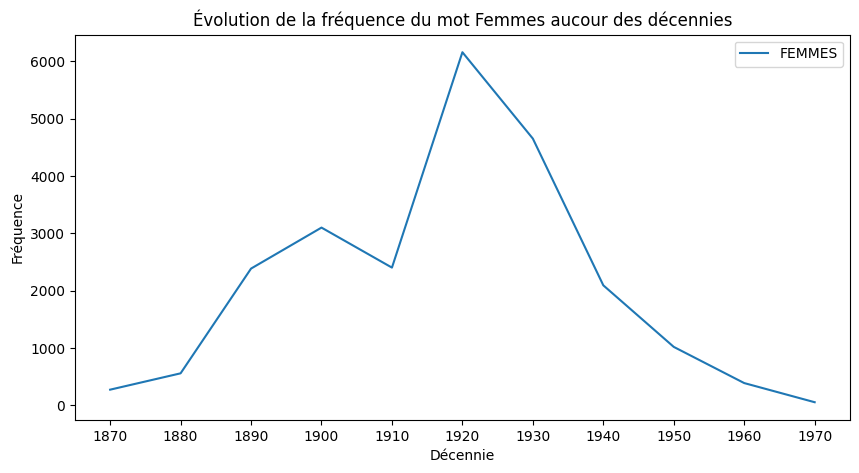

In [233]:
import os
import nltk
from collections import Counter
import matplotlib.pyplot as plt

def clean_text_and_get_frequencies(filename, folder):
    input_path = os.path.join(folder, filename)
    output_path = os.path.join(folder, filename.replace('.txt', '_clean.txt'))

    with open(input_path, 'r', encoding='utf-8') as f, open(output_path, "w", encoding='utf-8') as output:
        text = f.read()
        words = nltk.wordpunct_tokenize(text)
        kept = [w.upper() for w in words if len(w) > 2 and w.isalpha()]
        kept_string = " ".join(kept)
        output.write(kept_string)

    return Counter(kept)

folder_path = 'C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/tmp'  

# Les termes à suivre
terms = [ 'FEMMES']
frequencies = {term: [] for term in terms}
decades = []

for filename in os.listdir(folder_path):
    if filename.endswith(".txt") and not filename.endswith("_clean.txt"):
        decade = filename.replace('.txt', '')
        decades.append(decade)
        file_frequencies = clean_text_and_get_frequencies(filename, folder_path)

        for term in terms:
            frequencies[term].append(file_frequencies.get(term, 0))

# Tracer la courbe d'évolution
plt.figure(figsize=(10, 5))
for term in terms:
    plt.plot(decades, frequencies[term], label=term)

plt.xlabel('Décennie')
plt.ylabel('Fréquence')
plt.title('Évolution de la fréquence du mot Femmes aucour des décennies')
plt.legend()
plt.show()


# Word Embeddings : le modèle Word2Vec (exploration de l'univer semantique de notre corpus)

In [175]:
import sys

from gensim.models.phrases import Phrases, Phraser
from gensim.models import Word2Vec

import nltk
from nltk.tokenize import wordpunct_tokenize
from unidecode import unidecode

In [176]:
class MySentences(object):
    """Tokenize and Lemmatize sentences"""
    def __init__(self, filename):
        self.filename = filename

    def __iter__(self):
        for line in open(self.filename, encoding='utf-8', errors="backslashreplace"):
            yield [unidecode(w.lower()) for w in wordpunct_tokenize(line)]

In [177]:
infile = f"C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/sen.txt"
sentences = MySentences(infile)

In [178]:
bigram_phrases = Phrases(sentences)

In [179]:
type(bigram_phrases.vocab)

dict

In [180]:
len(bigram_phrases.vocab.keys())

3549740

In [181]:
key_ = list(bigram_phrases.vocab.keys())[144]
print(key_)

aucun


In [182]:
bigram_phrases.vocab[key_]

2714

In [183]:
bigram_phraser = Phraser(phrases_model=bigram_phrases)

In [184]:
trigram_phrases = Phrases(bigram_phraser[sentences])

In [185]:
trigram_phraser = Phraser(phrases_model=trigram_phrases)

### Création d'un corpus d'unigrams, bigrams, trigrams

In [186]:
corpus = list(trigram_phraser[bigram_phraser[sentences]])

In [187]:
print(corpus[:100])

[['\\', 'la', 'propagande_communiste', 'parmi_les', 'femmes', 'la', 'federation_bruxelloise', 'du_parti', 's', "'", 'est', 'preoccupee', 'recemment', 'de', 'la', 'constitution', ',', 'dans', 'son_sein', ',', 'd', "'", 'une', 'commission_speciale_chargee', 'du_travail', 'd', "'", 'organisation', 'et', 'de', 'propagande_parmi', 'les', 'femmes', '.'], ['nous_publions', ',', 'in', '-', 'extenso', ',', 'l', "'", 'interessant', 'et', 'documente', 'rapport', 'soumis', 'par', 'la', 'camarade', 'kestemont', ',', 'membre', 'du_comite_central', ',', 'a', 'la', 'reunion', 'des', 'membres_feminins', 'du_parti', ',', 'tenue', 'le', '6_decembre', '1921', '.'], ['les', 'differentes_federations', 'du', 'pays', 'voudront', 'sans_aucun_doute', 's', "'", 'inspirer', 'de', 'ce', 'travail', 'pour', 'le', 'developpement', 'de', 'l', "'", 'organisation', 'communiste', 'parmi_les', 'femmes', '.'], ['cheres_camarades', ',', 'vail', 'de', 'gropagande', 'parmi_les', 'femmes_communistes', ',', 'les', 'sections_loc

### Entrainement d'un modèle Word2Vec sur ce corpus (on va transformé notre liste de phrase en liste de mot)

In [188]:
%%time
model = Word2Vec(
    corpus, # On passe le corpus de ngrams que nous venons de créer
    vector_size=32, # Le nombre de dimensions dans lesquelles le contexte des mots devra être réduit, aka. vector_size
    window=5, # La taille du "contexte", ici 5 mots avant et après le mot observé
    min_count=10, # On ignore les mots qui n'apparaissent pas au moins 5 fois dans le corpus (jouer sur la frequence des mot)
    workers=4, # Permet de paralléliser l'entraînement du modèle en 4 threads
    epochs=5 # Nombre d'itérations du réseau de neurones sur le jeu de données pour ajuster les paramètres avec la descente de gradient, aka. epochs.(plus on a en fait plus ca prend du temps)
)

CPU times: total: 1min 52s
Wall time: 41.8 s


In [189]:
outfile = f"C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/newspapers.model"
model.save(outfile)

## Explorer le modèle

In [190]:
model = Word2Vec.load("C:/Users/beaujo/Desktop/travaux_tp_sticB545/TP4_notebook/data2/newspapers.model")

#### Calculer la similarité entre deux termes

In [191]:
model.wv.similarity("femmes", "droits")

0.55937076

In [192]:
model.wv.similarity("femmes", "menageres")

0.6738663

In [193]:
model.wv.similarity("femmes", "mouvement")

0.31604484

In [194]:
model.wv.similarity("femmes", "hommes")

0.8065431

In [195]:
model.wv.most_similar("femmes", topn=10)

[('travailleurs', 0.8234142065048218),
 ('hommes', 0.8065429925918579),
 ('travailleuses', 0.7678913474082947),
 ('ouvriers', 0.762981116771698),
 ('jeunes_filles', 0.7298914194107056),
 ('ouvrieres', 0.7276043891906738),
 ('socialistes', 0.7169491052627563),
 ('electeurs', 0.7142468094825745),
 ('catholiques', 0.6992961764335632),
 ('chomeurs', 0.6841006875038147)]

In [196]:
model.wv.most_similar("emancipation", topn=10)

[('education', 0.9076076745986938),
 ('egalite', 0.9033224582672119),
 ('affranchissement', 0.886843204498291),
 ('organisation_syndicale', 0.8854131698608398),
 ('egalite_politique', 0.8748635053634644),
 ('unite', 0.8655794262886047),
 ('education_politique', 0.8441206812858582),
 ('action_politique', 0.8421676754951477),
 ('enfance', 0.8392780423164368),
 ('inferiorite', 0.8357604146003723)]